# PIT - Práctica 3: Detección de Actividad de Voz (VAD)

**Alicia Lozano Díez** y **Pablo Ramírez Hereza**
 
 
**Estudiante: Francisco Javier Sáez Maldonado**

## Objetivo

El objetivo de esta práctica es proporcionar una introducción al procesamiento de señales temporales de voz, y desarrollar de un detector de actividad de voz basado en redes neuronales recurrentes, en particular, LSTM.

### Materiales

- Guión (.ipynb) de la práctica - Moodle
- Ejemplos de datos y etiquetas - Moodle
- Listas de entrenamiento y validación - Moodle
- Scripts de descarga de datos - Moodle
- Datos y etiquetas de entrenamiento * - One Drive [enlace](https://dauam-my.sharepoint.com/:u:/g/personal/alicia_lozano_uam_es/EdCueYU7BpNAuo6BawH8hJAB5rclap745BmsPzXgSPhsgw?e=Fh9adH)
- Datos y etiquetas de validación * - One Drive [enlace](https://dauam-my.sharepoint.com/:u:/g/personal/alicia_lozano_uam_es/EWBjWyX774pLhJc2ahr4zk0BtLvWt7YGhdMDDmGu-LcBNQ?e=sbgtjF)


**CUIDADO: * Los datos proporcionados son de uso exclusivo para esta práctica. No tiene permiso para copiar, distribuir o utilizar el corpus para ningún otro propósito.** 


**Nota.-** Añadimos primero una celda con la que debemos cargar los archivos de la siguiente lista, que serán necesarios durante el desarrollo de la práctica. (Con esto, queremos evitar celdas en las que se haga `files.upload()` durante el desarrollo de la práctica. La lista de archivos es:

- *audio_sample.wav*
- *audio_sample_labels_1.voz* y *audio_sample_labels_2.voz*
- *training_VAD.lst*
- *data_download_onedrive_training__VAD.sh*
- *audio_sample_test.wav* y *audio_sample_test.mat*
- *valid_VAD.lst*
- *data_download_onedrive_valid_VAD.sh*

In [45]:
from google.colab import files
import IPython
uploaded = files.upload()

Saving valid_VAD.lst to valid_VAD.lst


# 1. Introducción al procesamiento de señales temporales de voz

## 1.1. Descarga de ficheros de ejemplo

Primero vamos a descargar el audio de ejemplo de Moodle (**audio_sample.wav**).

Una vez cargado el fichero de audio, podemos escucharlo de la siguiente manera: 

In [5]:
wav_file_name = "audio_sample.wav"
print(wav_file_name)
IPython.display.Audio(wav_file_name)

audio_sample.wav


## 1.2. Lectura y representación de audio en Python

A continuación vamos a definir ciertas funciones para poder hacer manejo de  ficheros de audio en Python. 

Comenzamos definiendo una función **read_recording** que leerá un fichero de audio WAV, normalizará la amplitud y devolverá el vector de muestras _signal_ y su frecuencia de muestreo _fs_.

In [6]:
import scipy.io.wavfile

def read_recording(wav_file_name): 
  fs, signal = scipy.io.wavfile.read(wav_file_name)
  signal = signal/max(abs(signal)) # normalizes amplitude
  
  return fs, signal


Si ejecutamos la función anterior para el fichero de ejemplo, podemos ver la forma en la que se carga dicho fichero de audio en Python. Así, podemos obtener la frecuencia de muestreo y la longitud del fichero en número de muestras:

In [7]:
fs, signal = read_recording(wav_file_name) 
print("Signal variable shape: " + str(signal.shape))
print("Sample rate: " + str(fs))
print("File length: " + str(len(signal)) + " samples")
print("Audio duration: {} seconds".format(len(signal)/fs))

Signal variable shape: (67072,)
Sample rate: 16000
File length: 67072 samples
Audio duration: 4.192 seconds


**PREGUNTAS:**

- ¿Como obtendría la duración de la señal en segundos?

Es tan sencillo como saber que la frecuencia de muestreo es el tiempo entre cada toma de muestras, por lo que, si $D$ es la duración, $f_s$ es la frecuencia de muestreo (que `scipy` nos devuelve en muestras por segundo) y tenemos $n$ muestras, entonces
$$
D = \frac{n}{f_s} = \frac{67072}{16000} = 4.192 \text{ segundos}
$$

También podemos representar la señal y ver su forma de onda. Para ello, definimos la función **plot_signal** como sigue:

**Hemos modificado la función para añadir un parámetro opcional que indique la label a la hora de hacer la leyenda**

In [8]:
import matplotlib.pyplot as plt
import numpy as np

def plot_signal(signal, fs, ylabel="", title="", label = ""):
  dur = len(signal)/fs
  step = 1./fs
  t_axis = np.arange(0., dur, step)

  plt.plot(t_axis, signal,label = label)
  plt.xlim([0, dur])
  plt.ylabel(ylabel)
  plt.xlabel('Time (seconds)')
  plt.title(title)
  plt.grid(True)


Y utilizando la función anterior, obtenemos su representación (amplitud frente al tiempo):

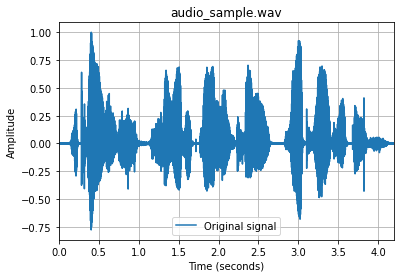

In [9]:
plot_signal(signal, fs, "Amplitude", wav_file_name,label = "Original signal")
plt.legend()
plt.show()

## 1.3. Representación de etiquetas de actividad de voz

En esta práctica, vamos a desarrollar un detector de actividad de voz, que determinará qué segmentos de la señal de voz son realmente voz y cuáles silencio.

Por ello, vamos a ver dos ejemplos de etiquetas _ground truth_, que corresponden al fichero de audio de ejemplo. 

Primero, descargamos de Moodle las etiquetas de voz/silencio que están en los ficheros **audio_sample_labels_1.voz** y **audio_sample_labels_2.voz** y las cargamos en Google Colab como en el caso anterior.

Estas etiquetas están guardadas en ficheros de texto y podemos cargarlas en Python de la siguiente manera:

In [ ]:
labels_file_name = 'audio_sample_labels_1.voz'
voice_labels = np.loadtxt(labels_file_name)

Con el siguiente código, podemos representar la señal de voz así como sus etiquetas en la misma figura:

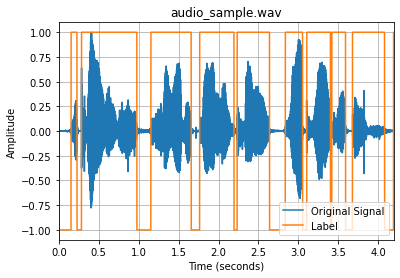

In [ ]:
plot_signal(signal, fs,label = "Original Signal")
plot_signal(voice_labels*2-1, fs, "Amplitude", wav_file_name, label = "Label")
plt.legend()
plt.show()

In [ ]:
labels_file_name_2 = 'audio_sample_labels_2.voz'
voice_labels_2 = np.loadtxt(labels_file_name_2)

Las etiquetas de voz/silencio provienen de distintos detectores de actividad de voz. 

**PREGUNTAS:**
- ¿Qué valores tienen las etiquetas? ¿Qué significan dichos valores?

Vemos que las etiquetas tienen valores $\{-1,1\}$. Esto tiene bastante sentido, pues lo que queremos representar es si alguien está hablando (representado por un $1$), o si no hay nadie hablando (representado por un $-1$).

- ¿Por qué se representa _voice_labels*2-1_?

Esto se hace porque en el fichero tenemos valores $1$ y $0$, y nos interesa que las partes en las que no haya nadie hablando se les de la etiqueta $-1$.


- Represente la señal de voz junto con las etiquetas para ambos casos e incluya las figuras en el informe de la práctica. ¿Qué diferencias observas? ¿A qué se puede deber?


Puesto que hemos modificado la función de dibujado para añadir las etiquetas, podemos dibujar ambos etiquetados sobre la misma figura.


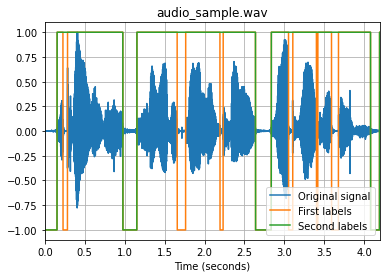

In [ ]:
plot_signal(signal, fs, label = "Original signal")
plot_signal(voice_labels*2-1, fs, "Amplitude", wav_file_name, label="First labels")
plot_signal(voice_labels_2*2-1,fs,"", wav_file_name, label="Second labels")
_ = plt.legend()
_ = plt.plot()

Estas diferencias pueden deberse a diferentes factores. Podemos hacer una enumeración de algunos ejemplos:

1. La frecuencia de muestreo de ambos detectores de actividad es diferente
2. El umbral a partir del cual los detectores indican que está habiendo una voz/sonido es diferente
3. La precisión de estos detectores no es la misma (uno es más preciso que el otro).


- ¿Qué cantidad de voz/silencio hay en cada etiquetado?

Para esto, tenemos que contar el número de etiquetas de cada tipo de alguna manera y entonces calcular la duración a partir de la frecuencia de muestreo igual que lo hacíamos en un apartado anterior. Definimos una función que nos lo calcule:

In [ ]:
def voice_silence_quantity(labels, f_s):
  count_voice = np.count_nonzero(labels)

  print("Voice time: {} seconds".format(count_voice/fs))
  print("Silent time: {} seconds".format( (len(labels)-count_voice)/fs))

print("First labels")
voice_silence_quantity(voice_labels,fs)
print("Second labels")
voice_silence_quantity(voice_labels_2,fs)

First labels
Voice time: 3.1969375 seconds
Silent time: 0.9950625 seconds
Second labels
Voice time: 3.5544375 seconds
Silent time: 0.6375625 seconds


Podemos observar como, según el segundo detector de audio, tenemos más tiempo hablanod y menos tiempo en silencio que en el primero.

## 1.4. Extracción de características

En la mayoría de sistemas de reconocimiento de patrones, un primer paso es la extracción de características. Esto consiste, a grandes rasgos, en obtener una representación de los datos de entrada, que serán utilizados para un posterior modelado. 

En nuestro caso, vamos pasar de la señal en crudo _"raw"_ dada por las muestras (_signal_), a una secuencia de vectores de características que extraigan información a corto plazo de la misma y la representen. Esta sería la entrada a nuestro sistema de detección de voz basado en redes neuronales.

Para ver algunos ejemplos, vamos a utilizar la librería _librosa_ (https://librosa.org/doc/latest/index.html). 

Dentro de esta librería, tenemos funciones para extraer distintos tipos de características de la señal de voz, como por ejemplo el espectrograma en escala Mel (_melspectrogram_). 

Estas características a corto plazo, se extraen en ventanas de unos pocos milisegundos con o sin solapamiento. 

Un ejemplo sería el siguiente:


In [ ]:
import librosa

mel_spec = librosa.feature.melspectrogram(signal,
                                          fs,
                                          n_mels=23,
                                          win_length=320,
                                          hop_length=160)

print(mel_spec.shape)
print(signal.shape)

(23, 420)
(67072,)


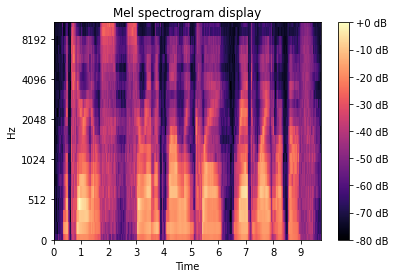

In [ ]:
import librosa.display
fig, ax = plt.subplots()
M_db = librosa.power_to_db(mel_spec, ref=np.max)
img = librosa.display.specshow(M_db, y_axis='mel', x_axis='time', ax=ax)
ax.set(title='Mel spectrogram display')
fig.colorbar(img, ax=ax, format="%+2.f dB")

**PREGUNTAS:**
- ¿Qué se obtiene de la función anterior? 

Al ejecutar la función anterior obtenemos el **espectrograma en escala de Mel**. La escala habitual de las señales es la *frecuencia*. Para obtener una señal en escala de Mel tenemos que hacer la transformación de la frecuencia habitual $f$ a Mels $m$. Una fórmula habitual para hacer esto es
$$
m=2595\log _{10}\left(1+{\frac {f}{700}}\right)
$$

- ¿Qué significan los valores de los parámetros _win_length_ y _hop_length_?

1. El `win_length` es el tamaño de la ventana usado para el enventanado de la señal de audio. Si el tamaño de la ventana no llega al tamaño de ventana usado para calcular la FFT de la señal (parámetro `n_fft`), se rellena con ceros hasta llegar a este tamaño. Esto es porque es más óptimo estimar la FFT usando un número de puntos que sea potencia de dos.

2. El `hop_length` es el número de elementos que se dejan entre ventanas sucesivas. Si tomásemos por ejemplo `hop_length = win_length`, entonces tendríamos ventanas sin solapar.

- ¿Qué dimensiones de _mel_spec_ obtienes? ¿Qué significan? 


Vemos que hemos obtenido unas dimensiones de $23 \times 420$ en el espectrograma. Este $23$ es el número de mels (*features* generadas) que le hemos indicado como parámetro, y $420$ es el número de ventanas totales que hemos necesitado. Este número se calcula como el cociente entre el tamaño total de la señal y la distancia entre inicios de ventana (`hop_length`)

In [ ]:
hop_length = 160
print(mel_spec.shape[1] * hop_length )
print(signal.shape)

67200
(67072,)


Vemos que hemos obtenido una pequeña diferencia, que ha ocurrido porque para la última ventana tenemos menos elementos en la señal que el tamaño de la ventana. Lo que se suele hacer en estos casos es añadir *zero padding* o recortar esta última ventana.


De esta manera, podríamos obtener una parametrización de las señales para ser utilizadas como entrada a nuestra red neuronal. 

Para los siguientes apartados, se proporcionan los vectores de características MFCC para una serie de audios que se utilizarán como conjunto de entrenamiento del modelo de VAD.

# 2. Detector de actividad de voz (Voice Activity Detector, VAD)



## 2.1. Descarga de los datos de entrenamiento

Primero vamos a descargar la lista de identificadores de los datos de entrenamiento de la práctica. 

Para ello, necesitaremos descargar de Moodle el fichero **training_VAD.lst**, y ejecutar las siguientes líneas de código, que nos permitirán cargar el archivo a Google Colab desde el disco local:

A continuación cargamos los identificadores contenidos en el fichero en una lista en Python:

In [13]:
file_train_list = 'training_VAD.lst' # mat files containing data + labels
f = open(file_train_list, 'r')
train_list = f.read().splitlines()
f.close()

Podemos ver algunos de ellos (los primeros 10 identificatores) de la siguiente forma:

In [32]:
print(train_list[:3])

['features_labs_1.mat', 'features_labs_10.mat', 'features_labs_100.mat']


Ahora, descargaremos de Moodle el fichero **data_download_onedrive_training_VAD.sh**, y lo cargamos en Google Colab.

Para descargar el conjunto de datos desde One drive, ejecutamos el script cargado anteriormente de la siguiente manera:

In [ ]:
!chmod 755 data_download_onedrive_training_VAD.sh
!./data_download_onedrive_training_VAD.sh

Este script descargará los datos de One Drive y los cargará en Google Colab, descomprimiéndolos en la carpeta **data/training_VAD**.

Podemos comprobar que los ficheros **.mat** se encuentran en el directorio esperado:


In [17]:
!ls data/training_VAD/ | head

features_labs_100.mat
features_labs_101.mat
features_labs_102.mat
features_labs_103.mat
features_labs_104.mat
features_labs_105.mat
features_labs_106.mat
features_labs_107.mat
features_labs_108.mat
features_labs_109.mat


## 2.2. Definición del modelo

Utilizando la librería Pytorch (https://pytorch.org/docs/stable/index.html), vamos a definir un modelo de ejemplo con una capa LSTM y una capa de salida. La capa de salida estará formada por una única neurona. La salida indicará la probabilidad de voz/silencio utilizando una función *sigmoid*. 

In [18]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Model_1(nn.Module):
    def __init__(self,
                 feat_dim : int = 20,
                 hidden_size = 256,
                 bidirectional : bool = False):
        super(Model_1, self).__init__()


        self.lstm = nn.LSTM(input_size = feat_dim,
                            hidden_size = hidden_size,
                            batch_first=True,
                            bidirectional=bidirectional)
        # Compute linear size for the bidirectional case
        linear_size = hidden_size if not bidirectional else 2*hidden_size
        self.output = nn.Linear(linear_size,1)

    def forward(self, x):

        out = self.lstm(x)[0]
        out = self.output(out)
        out = torch.sigmoid(out)

        return out.squeeze(-1)

**PREGUNTAS:**
- ¿Qué tamaño tiene la entrada a la capa LSTM? 

El atributo `self.lstm` contiene una LSTM definida por `pytorch`. Le damos nombre a las variables según la [documentación](https://pytorch.org/docs/stable/generated/torch.nn.LSTM.html) de las LSTM de pytorch. Según esta documentación, la **entrada** tiene un tamaño `feat_dim`, que hemos puesto por defecto a $20$.

- ¿Cuántas unidades (celdas) tiene dicha capa LSTM?

Es el parámetro `hidden_size`, en nuestro caso es $256$.

- ¿Qué tipo de matriz espera la LSTM? Mirar la documentación y describir brevemente.

Vamos a llamar $N$ al batch size, $L$ a la longitud de una secuencia y $H_{in}$ al tamaño de entrada (`input_size`). Entonces,la LSTM espera un **tensor** de dimensiones $(L,N,H_{in})$ cuando el parámetro `batch_first = False` y un tensor de dimensiones $(N,L,H_{in})$ cuando el parámetro `batch_first = True`. Podrían ser varaibles con longitud variable, pero tendríamos que cambiar otros parámetros.

Este tensor es obligatorio, pero también se le puede pasar adicionalmente $(h_0,c_0)$ siendo $h_0$ los estados ocultos iniciales para cada elemento del batch y $c_0$ el estado de la celda inicial para cada elemento del batch. Si no se le pasa


- Revisar la documentación de _torch.nn.LSTM_ y describir brevemente los argumentos _batch_first_, _bidirectional_ y _dropout_.

El parámetro `batch_first` hace referencia a cómo tiene que interpretar la LSTM los *tensores* que le damos como entrada. La interpretación que hace es la que hemos indicado en la pregunta anterior. El valor por defecto es `False`.

El parámetro `bidirectional` indica si la LSTM será o no bidireccional.

El parámetro `dropout` es el parámetro estándar de dropout de las redes neuronales. Este parámetro indica si vamos a *matar* neuronas para que dejen de entrenarse con una probabilidad $p$.

- En este modelo, estamos utilizando una única neurona a la salida. ¿Hay alguna otra alternativa? ¿Se seguiría utilizando una función _sigmoid_?

Tenemos un vector de tamaño $256$ como entrada a esta neurona. Podríamos aplicar una nueva **red neuronal** a estas características para posiblemente seleccionar aún más las características extraídas por la LSTM. En este caso, al final de esta nueva red neuronal, se volvería a usar una función sigmoidal, pues nos da una probabilidad de pertenecer a una clase.

- ¿Para qué sirve la función _forward_ definida en la clase _Model_1_?

Esta función define qué proceso sigue una entrada $x$ cuando se le pasa a la red. En nuestro caso, primero se le aplica la LSTM, luego la neurona única y por último la función de activación.

Una vez definida la clase, podemos crear nuestra instancia del modelo y cargarlo en la GPU con el siguiente código:

In [19]:
model = Model_1(feat_dim=20, bidirectional = False)
model = model.to(torch.device("cuda"))
print(model)

Model_1(
  (lstm): LSTM(20, 256, batch_first=True)
  (output): Linear(in_features=256, out_features=1, bias=True)
)


Nuestra variable _model_ contiene el modelo, y ya estamos listos para entrenarlo y evaluarlo.

##2.3. Lectura y preparación de los datos para el entrenamiento

Como hemos visto anteriormente, nuestros datos están guardados en ficheros de Matlab (**.mat**). Cada uno de estos ficheros contiene una matriz **X** correspondiente a las secuencias de características MFCC (con sus derivadas de primer y segundo orden), y un vector **Y** con las etiquetas de voz/silencio correspondientes.

Veamos un ejemplo: 


In [20]:
features_file = 'data/training_VAD/features_labs_1.mat'

import scipy.io
features = scipy.io.loadmat(features_file)['X']
labels = scipy.io.loadmat(features_file)['Y']

print(features.shape)
print(labels.shape)


(46654, 60)
(46654, 1)


**PREGUNTAS:**
Elegir un fichero de entrenamiento y responder a las siguientes preguntas: 
- ¿Qué tamaño tiene **features**? ¿Y **labels**?

- Una de las dimensiones de la **features** es 60, correspondiente a los 20 coeficientes MFCC concatenados con las derivadas de primer y segundo orden. ¿Con qué se corresponde la otra dimensión?

Podemos responder a las **dos preguntas** conjuntamente:

Vemos que las dimensiones de las features es $(46654, 60)$, mientras que la de las etiquetas es $(46654, 1)$. Sabemos que siempre tenemos que tener para cada elemento del conjunto de entrenamiento una etiqueta. Por ello, tenemos que $46654$ es el número de ejemplos de entrenamiento que tenemos, y es a este número de ejemplos de entrenamientoa lo que corresponde esa primera dimensión.

El entrenamiento del modelo se va a realizar mediante descenso por gradiente (o alguna de sus variantes) basado en _batches_. 

Para preparar cada uno de estos _batches_ que servirán de entrada a nuestro modelo LSTM, debemos almacenar las características en secuencias de la misma longitud. El siguiente código lee las características (**get_fea**) y sus correspondientes etiquetas (**get_lab**) de un fragmento aleatorio del fichero de entrada. 

In [21]:
import scipy.io
import numpy as np

length_segments = 300 

def get_fea(segment, rand_idx):
    data = scipy.io.loadmat(segment)['X']
    # Select starting point for frame
    # First pos if shape[0] < length, random else.
    if data.shape[0] <= length_segments:
        start_frame = 0
    else:
        start_frame = np.random.permutation(data.shape[0]-length_segments)[0]

    end_frame = np.min((start_frame + length_segments,data.shape[0]))
    rand_idx[segment] = start_frame
    feat = data[start_frame:end_frame,:20] # discard D and DD, just 20 MFCCs
    return feat[np.newaxis, :, :]   

def get_lab(segment, rand_idx):
    data = scipy.io.loadmat(segment)['Y']
    start_frame = rand_idx[segment]
    end_frame = np.min((start_frame + length_segments, data.shape[0]))
    labs = data[start_frame:end_frame].flatten()
    return labs[np.newaxis,:]

**PREGUNTAS:**
Analizar las funciones anteriores detenidamente y responder a las siguientes cuestiones:
- ¿De qué tamaño son los fragmentos que se están leyendo?

Vemos que los fragmentos se están tomando de tamaño `length_segments`, que estaba definido más abajo en el código. Lo hemos cambiado añadiéndolo a la celda de código anterior para mayor entendimiento del mismo.

- ¿Para qué sirve _rand_idx_?

Esta variable es un diccionario que mantiene en qué posición se ha empezado a tomar las `features` en cada iteración, y sirve para que tomemos bien las etiquetas del conjunto de etiquetas, es decir, para que tomemos correctamente la etiqueta correspondientes a cada muestra.

## 2.4. Entrenamiento del modelo
Una vez definidas las funciones de lectura de datos y preparación del formato que necesitamos para la entrada a la red LSTM, vamos a entrenarlo.

Definimos primero dos funciones:

- `plot_loss_acc` que recibe dos vectores con los valores de la función de pérdida y el accuracy en cada época y los dibuja.

- `predict(model, features)` que realiza la predicción sobre un conjunto de datos usando el modelo pasado. Hay que tener varias cosas en cuenta para esto: 
Por último, hacemos una predicción. Hay que tener varias cosas en cuenta:

1. Tenemos que indicar a `pytorch` que no se calculen los gradientes
2. Tenemos que indicarle al modelo que se encuentra en modo de evaluación. Esto lo haremos ANTES de llamar a predict.
3. No debemos olvidarnos de que el modelo espera tensores como entrada.

In [22]:
import matplotlib.pyplot as plt
def plot_loss_acc(losses,accs,labels = [""], title = "Loss and Accuracy"):

  xs = np.arange(1,len(losses[0])+1,1)

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(21,6))
  fig.suptitle(title)
  # Loss plot
  for loss,lab in zip(losses,labels):
    ax1.plot(xs, loss, label = lab)

  ax1.set_xlabel("Epoch")
  ax1.set_ylabel("Loss")
  ax1.legend()

  # Acc plot
  for acc,lab in zip(accs,labels):
    ax2.plot(xs, acc, label = lab)
  ax2.set_xlabel("Epoch")
  ax2.set_ylabel("Accuracy")
  ax2.legend()

  plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
  
  
  plt.show()


In [23]:
path_train = 'data/training_VAD/'

from torch import optim

def predict(model,tensor_features):
  """
    Predicts using a model and a tensor of features (N_examples, example_instants, features_per_instant)
    Example of getting the tensor:
    tensor = np.vstack([get_fea(path_in_feat + segment, rand_idx) for segment in segment_set])
    Model should be in EVAL mode
  """
  # save output
  y_pred = []
  # Make model not to learn
  with torch.no_grad():
    # Move audio to device
    device_audio = torch.tensor(tensor_features.astype("float32")).to(torch.device("cuda"))
    # Predict
    output = model(device_audio)

    # Compute acc
    outputs_numpy = output.cpu().detach().numpy().flatten()
    y_pred = np.array([1 if p >= 0.5 else 0 for p in outputs_numpy])

  return np.array(y_pred)

Creamos ahora una función de `train`, que dado un modelo, un `path` al conjunto de train y una lista de train, así como un número de épocas, realiza el entrenamiento del modelo el número de épocas que se le indique.

In [24]:
def train_model(model,
                path_train,
                X_list,
                epochs = 5):

  # Reproducibility
  np.random.seed(123)
  torch.manual_seed(1234)

  # Loss function and optimizer
  criterion = nn.BCELoss()
  optimizer = optim.Adam(model.parameters(), lr=0.001)

  # Batches
  batch_size = 51
  segment_sets = np.array_split(X_list, len(X_list)/batch_size)

  # Logs for train
  losses = np.zeros(epochs-1)
  accs = np.zeros(epochs - 1)

  for epoch in range(1, epochs):
    print('Epoch: {}/{}'.format(epoch,epochs-1))
    #model.train()
    cache_loss = 0.0
    cache_acc = 0.0

    y_true = []
    y_pred = []

    for ii, segment_set in enumerate(segment_sets):

      # Set model to train mode
      model.train()

      rand_idx = {}
      optimizer.zero_grad()

      # Create training batches
      train_batch_read = np.vstack([get_fea(path_train + segment, rand_idx) for segment in segment_set])
      labs_batch_read = np.vstack([get_lab(path_train + segment, rand_idx).astype(np.int16)  for segment in segment_set])
      assert len(labs_batch_read) == len(train_batch_read) # make sure that all frames have defined label
      # Shuffle the data and place them into Pytorch tensors
      shuffle = np.random.permutation(len(labs_batch_read))
      labs_batch = torch.tensor(labs_batch_read.take(shuffle, axis=0).astype("float32")).to(torch.device("cuda"))
      train_batch = torch.tensor(train_batch_read.take(shuffle, axis=0).astype("float32")).to(torch.device("cuda"))

      # Forward the data through the network
      outputs = model(train_batch)

      # Compute cost
      loss = criterion(outputs, labs_batch)

      # Backward step
      loss.backward()
      optimizer.step()
      
      # Cache values
      cache_loss += loss.item()

      # Change mode to eval
      model.eval()
      y_pred.extend(predict(model,train_batch_read))
      y_true.extend(labs_batch_read.flatten())

    # Logs
    y_pred = np.array(y_pred, dtype=np.float32)
    y_true = np.array(y_true, dtype=np.float32)
    losses[epoch-1] = cache_loss/len(train_batch)
    accs[epoch-1]   = np.mean(y_true == y_pred)
    print("Loss: " + str(losses[epoch-1]))
    print("Acc : " + str(accs[epoch-1]))

  return model, accs, losses

Podemos entonces entrenar el modelo, lo llamamos `model_first`. Usamos este y no el anterior pues nos interesa que, si volvemos a ejecutar la celda para entrenar el modelo, el modelo se *re-inicialice*, pues si no volveríamos a entrenar el modelo partiendo del modelo actual (que ya ha sido entrenado).

In [38]:
model_first = Model_1(feat_dim=20, bidirectional = False)
model_first = model_first.to(torch.device("cuda"))
model_first, accs_first_model, losses_first_model =  train_model(model, path_train, train_list, epochs = 5)

Epoch: 1/4
Loss: 0.06037235289227729
Acc : 0.8888104575163399
Epoch: 2/4
Loss: 0.054547136320787316
Acc : 0.8928039215686274
Epoch: 3/4
Loss: 0.05636836646818647
Acc : 0.8901895424836601
Epoch: 4/4
Loss: 0.04818863144107893
Acc : 0.9076666666666666


**PREGUNTAS:**
Analizar el código anterior cuidadosamente y ejecutarlo. A continuación, responder a las siguientes cuestiones:
- ¿Qué función de coste se está optimizando? Describir brevemente con ayuda de la documentación. 

Vemos que se está utilizando `nn.BCELoss()`. Mirando la documentación, vemos que esta función nos devuelve la **Entropía Cruzada Binarizada**. Vamos a definir esta entropía. Consideramos el logaritmo de la verosimilitud en un problema de clasificación binaria:

$$
l_n = -w_n \left[ y_n \cdot \log x_n  + (1-y_n)\cdot \log (1- x_n)\right].
$$

entonces, si $L = \{l_1,\dots, l_N\}^T$, donde $N$ es el tamaño de batch la Entropía cruzada binarizada es

$$
l(x,y) = \begin{cases} mean(L), & \text{ if reduction} = \text{'mean'} \\ 
sum(L) & \text{ if reduction} = \text{'sum'}
\end{cases}
$$

donde 'mean' y 'sum' se le pueden pasar como parámetro a la función `BCELoss`..

- ¿Qué optimizador se ha definido?

Se ha definido como optimizador `Adam`, con un `learning_rate = 0.001` (que es un valor común en redes neuronales).

- ¿Para qué se utiliza _batch_size_?

El entrenamiento no se realiza utilizando en cada iteración todos los ejemplos del conjunto de entrenamiento, sino que se toma un subconjunto de ellos de tamaño `batch_size`. Se calculan los gradientes y la función de pérdida sobre este subconjunto en cada iteración.

- Describir brevemente la creación de los _batches_.

Los batches se crean en varias etapas. Para comenzar, se crea un array en el que se divide el conjunto de entrenamiento en `N` subconjuntos (o segmentos), donde $N = \frac{\text{tamaño total}}{\text{batch size}}$. 

Entonces, para crear un batch se seleccionan esoos $N$ nombres de archivo y se le pasan a la función `get_fea`, que lee esos archivos de disco y selecciona $300$ instantes temporales consecutivos comenzando en una posición aleatoria. Para esos instantes temporales, nos quedamos solo con las $20$ primeras características correspondientes a los MFCCs de ese audio. Entonces, hemos conseguido un tensor de dimensiones $(51,300,20)$ que será nuestro batch y es lo que usamos para entrenar nuestro modelo. 

- ¿Qué línea de código realiza el _forward pass_?

Este paso hacia adelante está hecho en la línea que "llama al modelo":
```python
# Forward the data through the network
outputs = model(train_batch)
```
Se obtienen las salidas del modelo, que son usadas para calcular el valor de la función de coste en el batch usado y luego realizar el backward pass.


- ¿Qué línea de código realiza el _backward pass_?

Se realiza después de calcular el valor de la función de pérdida con ese batch:

```python
# Backward step
loss.backward()
```


- ¿Cuántas iteraciones del algoritmo ha realizado? ¿Qué observa en la evolución de la función de coste?

Vemos que se han realizado `epochs - 1` iteraciones o épocas (pues empezamos desde la época 1 el bucle de entrenamiento.  En este caso, han sido 4 épocas.

La evolución de la función de pérdida la vemos en una gráfica un poco más adelante.


- Añada al código el cálculo de la precisión o _accuracy_, de tal manera que se muestre por pantalla dicho valor en cada iteración (similar a lo que ocurre con el valor del coste _loss_). Copiar el código en el informe y describir brevemente.

Escribimos código para añadir el cómputo del accuracy. Este código no es directo, pues como estamos entrenando con la GPU, lo primero que debemos hacer es pasar los array a la CPU para poder luego hacer los cálculos de manera sencilla.  Lo hacemos en los siguientes pasos:

Primero, creamos dos vectores para añadir todas las predicciones para un batch `y_true,y_pred`. A continuación, entrenamos el modelo y obtenemos el output del mismo. Este output nos indica la probabilidad de pertenecer a la clase $1$, es decir, de que alguien esté hablando en ese momento. Iteramos segmento a segmento, obteniendo $300$ predicciones por Obtenemos en cada paso $\text{batch\_size} \times \text{segment}\_\text{size} = 51 \times 300$ predicciones. Tenemos que pasarlas a primero a la CPU y luego a un único vector, para hacer la comparación con las etiquetas reales usando `numpy`.

```python
outputs_numpy = outputs.cpu().detach().numpy().flatten()
y_pred.extend([1 if p >= 0.5 else 0 for p in outputs_numpy])
y_true.extend( labs_batch.cpu().numpy().flatten())
```

A continuación, calculamos el accuracy usando las etiquetas obtenidas.

**Nota.-** Finalmente,se ha decidido crear una función `predict` a la que se le envía un tensor con las características y esta función pasa el tensor a la *GPU*, predice las etiquetas y las devuelve en formato `numpy`. Esta función usa en esencia el código anterior, salvo que necesita para predecir que el modelo no aprenda en esa pasada de los datos por el mismo, así que hay que establecer el modo del modelo en `model.eval()` (evaluación) y usar `torch.no_grad` para que no se calculen los gradientes.

- ¿Qué valor de coste y _accuracy_ obtiene? ¿Cómo se puede mejorar?

Dibujamos las curvas de función de pérdida y accuracy por cada época:

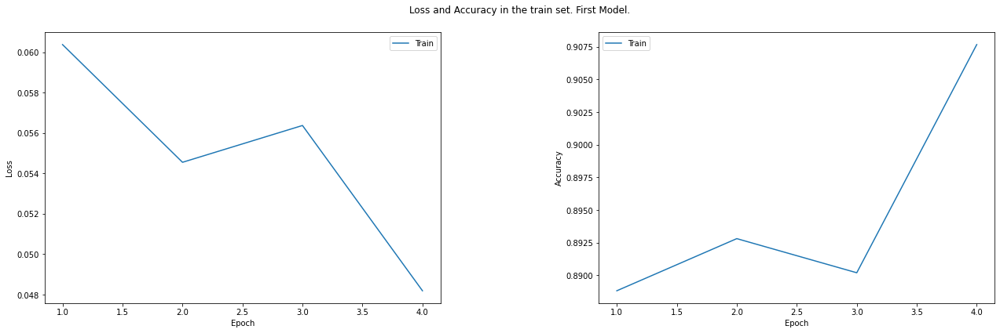

In [40]:
plot_loss_acc(
    [losses_first_model],
    [accs_first_model],
    ["Train"],
    "Loss and Accuracy in the train set. First Model.")

Se observa que la función de pérdida desciende en todas las épocas, llegando a valores por debajo de $0.05$. En cuanto al accuracy, obtenemos prácticamente un $90\%$.

En concreto, se han obtenido $loss = 0.048$ y $accuracy = 0.907$.

## 2.5. Evaluación del modelo: un único fichero de test

Una vez entrenado el modelo, vamos a evaluarlo en un ejemplo en concreto.

Descargue de Moodle el fichero **audio_sample_test.wav**, con sus correspondientes características y etiquetas **audio_sample_test.mat** y evalúe el rendimiento en el mismo.

**Proceso.-**

Vamos a realizar el mismo proceso que con el audio inicial: vamos a leerlo de  memoria y a imprimir algunas de sus características.

In [33]:
path_sample_text = "audio_sample_test.wav"
fs, signal = read_recording(path_sample_text) 
print("Signal variable shape: " + str(signal.shape))
print("Sample rate: " + str(fs))
print("File length: " + str(len(signal)) + " samples")
print("Audio duration: {} seconds".format(len(signal)/fs))

Signal variable shape: (4800160,)
Sample rate: 8000
File length: 4800160 samples
Audio duration: 600.02 seconds


A continuación cargamos sus features (MFCCs), nos quedamos con las 20 primeras componentes para descartar tanto la derivada como la segunda derivada como hacíamos anteriormente, y tomamos las etiquetas reales. 

In [42]:
features_file = 'audio_sample_test.mat'

# Obtain features and labels
features = scipy.io.loadmat(features_file)['X'][:,:20]
labels = scipy.io.loadmat(features_file)['Y'].flatten().astype("float32")

print(features.shape)
print(labels.shape)

(57777, 20)
(57777,)


In [43]:
# Create tensor for the prediction
features = features[np.newaxis, :,:]
model_first.eval()
predictions = predict(model_first,features)
acc = np.mean(predictions == labels)
print("Accuracy for Audio Sample Test: {}".format(acc))

Accuracy for Audio Sample Test: 0.9110026481125707



**PREGUNTAS:**
- Incluya en el informe de la práctica el código que ha utilizado para evaluar dicho fichero.

Esta pregunta ha sido respondida constructivamente en las celdas anteriores.

- ¿Cuál es el _accuracy_ obtenido para el fichero **audio_sample_test**?

Vemos que se ha obtenido un accuracy de aproximadamente $0.91$ por ciento, lo cual es bastante alto para ser un ejemplo que no está en nuestro conjunto ed entrenamiento.

- Represente 10 segundos de dicho audio, así como sus etiquetas de _ground_truth_ y las obtenidas con su modelo. Incluya dicha gráfica en el informe y comente brevemente el resultado. Visualmente, ¿es bueno el modelo? 


In [ ]:
segment = 1
n_seconds = 10  
n_labels_segment = n_seconds*100 
fs_labels = 100.0

signal_segment = signal[segment*n_seconds*fs:(segment + 1)*n_seconds*fs]
labels_segment = labels[segment*n_labels_segment:(segment + 1)*n_labels_segment]
labels_predicted_segment = predictions[segment*n_labels_segment:(segment + 1)*n_labels_segment]
pred_labels_segment = predictions[segment*n_labels_segment:(segment + 1)*n_labels_segment]

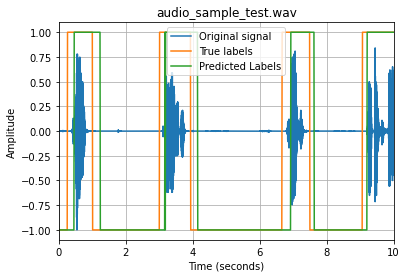

In [ ]:
plot_signal(signal_segment, fs, label = "Original signal")
plot_signal(labels_segment*2-1, fs_labels, "Amplitude", path_sample_text, label="True labels")
plot_signal(labels_predicted_segment*2-1, fs_labels, "Amplitude", path_sample_text, label="Predicted Labels")
_ = plt.legend()
_ = plt.plot()


Se puede observar que las etiquetas predichas son prácticamente las reales con un ligero desplazamiento pero, en general, realizan una buena predicción de nuestros datos.

- Escuche el audio y comente cualitativamente cómo es de bueno o malo el modelo.

In [ ]:
wav_file_name = "audio_sample_test.wav"
print(wav_file_name)
IPython.display.Audio(wav_file_name)

audio_sample_test.wav


Se han escuchado los diez primeros segundos, correspondientes al segmento que se ha dibujado. Usamos también la imagen para establecer la comparación. En el audio, no hay prácticamente voz hasta los últimos dos segundos, aunque tanto las etiquetas reales como las predichas digan los contrario. Hay ciertos sonidos que son ruidos, no realmente voz. Es por ello que podemos decir que nuestro modelo está **aprendiendo bien las etiquetas que se le dan**, pero quizá **necesite ser refinado** para aprender a distinguir lo que es ruido de lo que no lo es.

## 2.6. Evaluación del modelo: conjunto de validación





Ahora vamos a evaluar el rendimiento del modelo anterior sobre un conjunto de validación (del que conocemos sus etiquetas).

Para este conjunto de datos, descargaremos la lista de identificadores **valid_VAD.lst** de Moodle, así como el fichero de descarga de datos **data_download_onedrive_valid_VAD.sh**:

In [ ]:
!chmod 755 data_download_onedrive_valid_VAD.sh
!./data_download_onedrive_valid_VAD.sh

Escriba ahora el código necesario para evaluar el modelo anterior en el conjunto de datos de validación, para su última época. 

Tenga en cuenta que si quiere realizar el forward para todos los datos de validación de una vez, necesitará que todas las secuencias sean de la misma longitud. Como aproximación, puede escoger unos pocos segundos de cada fichero como se hace en el entrenamiento.

**Respuesta.-**

Tenemos que tener en cuenta que si queremos evaluar cómo mejora nuestro modelo en el conjunto de evaluación, debemos **redefinir** la variable `model` que contiene nuestro modelo, pues como esta ya ha sido entrenada, si volvemos a entrenarla estaríamos añadiendo más épocas al entrenamiento.

En cuanto a la extración de características, usamos la misma que hemos usado en el caso del entrenamiento para obtener una estimación de cómo de bueno es nuestro modelo en nuestro conjunto de validación.

In [46]:
# Read
file_valid_list = 'valid_VAD.lst' # mat files containing data + labels
f = open(file_valid_list, 'r')
valid_list = f.read().splitlines()
f.close()

path_valid = 'data/valid_VAD/'

In [47]:
def evaluate_validation(model, path_valid, valid_list, criterion = nn.BCELoss()):
  """
    Remember to modify model to be in eval model
  """
  rand_idx = {}
  # Create training batches for our predict function
  val_feats = np.vstack([get_fea(path_valid + audio_i, rand_idx) for audio_i in valid_list])
  val_labels = np.vstack([get_lab(path_valid + audio_i, rand_idx).astype(np.int16)  for audio_i in valid_list])
  assert len(val_feats) == len(val_labels) # make sure that all frames have defined label

  labs_cuda = torch.tensor(val_labels.astype("float32")).to(torch.device("cuda"))
  feats_cuda = torch.tensor(val_feats.astype("float32")).to(torch.device("cuda"))

  with torch.no_grad():
    predictions = predict(model,val_feats)
    loss = criterion(model(feats_cuda), labs_cuda).item()
  
  acc = np.mean(predictions == val_labels.flatten())
  

  return acc,loss


In [48]:
acc_valid_first, loss_valid_first = evaluate_validation(model_first, path_valid, valid_list)

In [57]:
print("Validation results for the first model")
print("\t Accuracy: " + str(acc_valid_first))
print("\t Loss    : " + str(loss_valid_first))

Validation results for the first model
	 Accuracy: 0.9081481481481481
	 Loss    : 0.2379959225654602


**PREGUNTAS:**
- Incluya en la memoria de la práctica el código utilizado, incluyendo los valores de cualquier parámetro de configuración utilizado (por ejemplo, el número de épocas de entrenamiento realizadas).

En general, no tenemos muchos hiperparámetros hasta ahora. Podemos mencionar:

- Número de épocas, fijado a $5$.
- $length\_segments = 300$, que es la longitud de los fragmentos de audio que se seleccionan de cada audio
- $n\_feats = 20$, que indica que cada segmento de audio tiene $20$ características
- $hidden\_size = 256$, que nos indica el número de celdas ocultas en la LSTM.

Todos estos hiperparámetros podrían ser afinados, haciendo por ejemplo una búsqueda en malla (`GridSearch`) para encontrar los que mejor ajustan nuestros datos.

- ¿Qué rendimiento (loss y accuracy) obtiene con este modelo (_Model_1_) en entrenamiento y en validación? 

Usando los resultados de las celdas anteriores, vemos que los resultados son los siguientes:


| Modelo          	| Train    	| Validation 	|
|-----------------	|----------	|------------	|
| Modelo Original 	| $0.9076$ 	| $0.9081$   	|

Vemos que son resultados bastante buenos, siendo incluso algo mejores en validación que en entrenamiento. Esto posiblemente se deba a que ambos conjuntos son bastante parecidos, pues no es lo habitual que en el conjunto de validación (que en este caso estamos usando como test), el resultado de la predicción sea mejor que en el conjunto de entrenamiento.

# 3. Comparación de modelos



## 3.1. Redes LSTM bidireccionales

En este apartado, vamos a partir del modelo inicial y modificarlo para que la capa LSTM sea bidireccional. 

Entrene el nuevo modelo y compare el resultado con el modelo inicial.

**Respuesta.-**

Podemos ver, si nos fijamos en el código del modelo definido anteriormente, que hemos generalizado este para que pueda admitir LSTMs bidireccionales. Para esto, basta con cambiar el parámetro `bidirectional = True` de la LSTM. **Además**, tenemos que modificar la entrada de la capa lineal, pues ahora la salida de la LSTM tiene el doble de tamaño. El código está generalizado para que acepte cualquier tipo de LSTMs.


Podemos realizar ahora el entrenamiento

In [52]:
# Redefine the model, otherwise we are training more
model_bi = Model_1(feat_dim=20, bidirectional = True)
model_bi = model_bi.to(torch.device("cuda"))

model_bi, accs_bi, losses_bi = train_model(model_bi,
                                          path_train,
                                          train_list,
                                          epochs = 5)

Epoch: 1/4
Loss: 0.11316630185819139
Acc : 0.7670915032679738
Epoch: 2/4
Loss: 0.08207082397797529
Acc : 0.8317450980392157
Epoch: 3/4
Loss: 0.061274310829592685
Acc : 0.8778692810457517
Epoch: 4/4
Loss: 0.046803967917666715
Acc : 0.9079019607843137


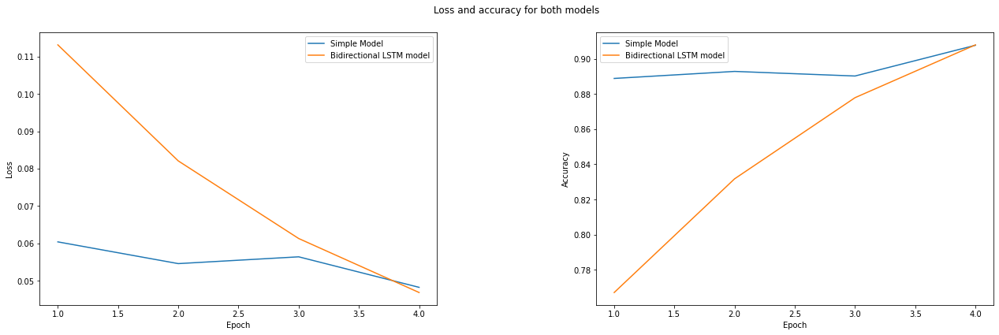

In [53]:
plot_loss_acc([losses_first_model,losses_bi],
              [accs_first_model,accs_bi],
              ["Simple Model", "Bidirectional LSTM model"],
              "Loss and accuracy for both models")

In [58]:
acc_valid_bi, loss_valid_bi = evaluate_validation(model_bi, path_valid, valid_list)

In [59]:
print("Validation results for the bidirectional model")
print("\t Accuracy: " + str(acc_valid_bi))
print("\t Loss    : " + str(loss_valid_bi))

Validation results for the bidirectional model
	 Accuracy: 0.9093981481481481
	 Loss    : 0.2265397608280182


**PREGUNTAS:**
- Explique brevemente la diferencia entre una capa LSTM y una BLSTM (bidirectional LSTM).

La diferencia teórica es que mientras que la red LSTM habitual usamos únicamente información sobre el estado pasado de la celda, es decir, información del pasado, en la LSTM **bidireccional** utilizamos información también sobre el **contexto futuro**, es decir, información de instantes temporales **posteriores**.

- Incluya el código donde define _Model_1B_ en el informe de la práctica.

Esta pregunta está resuelta en la celda de código encima de las gráficas anteriores.

- ¿Qué modelo obtiene un mejor resultado sobre los datos de validación? ¿Por qué puede ocurrir esto?

Viendo la tendencia de las gráficas que están hechas usando el conjunto de  entrenamiento, podemos ver que en las primeras épocas el modelo **original** tiene mejores resultados que el modelo bidireccional. Sin embargo, cuando llegamos a la última época, el modelo bidireccional es capaz de alcanzar al modelo original y podría superarlo en siguientes épocas.

Ahora, veamos en la siguiente tabla los resultados en validación:

| Modelo               	| Train    	| Validation 	|
|----------------------	|----------	|------------	|
| Modelo Original      	| $0.9076$ 	| $0.9081$   	|
| Modelo Bidirectional 	| $0.9079$ 	| $0.9093$   	|

Vemos que los resultados son prácticamente idénticos, no podemos detectar una diferencia entre ambos modelos, aunque viendo las curvas de entrenamiento podríamos decir que si solo podemos entrenar nuestros modelos $5$ épocas, sería quizá más seguro utilizar el original puesto que ajusta más rápido el conjunto de entrenamiento.

## 3.2. Modelo "más profundo"

En este apartado, vamos a partir nuevamente del modelo _Model_1_ y vamos a añadir una segunda capa LSTM tras la primera, con el mismo tamaño y configuración, definiendo un nuevo modelo _Model_2_.

Entrénelo y compare los resultados.

In [54]:
class Model_2(nn.Module):
    def __init__(self,
                 feat_dim : int = 20,
                 hidden_size = 256,
                 bidirectional : bool = False):
        super(Model_2, self).__init__()


        self.lstm = nn.LSTM(input_size = feat_dim,
                            hidden_size = hidden_size,
                            batch_first=True,
                            bidirectional=bidirectional)
        self.lstm_2 = nn.LSTM(input_size = hidden_size,
                            hidden_size = hidden_size,
                            batch_first=True,
                            bidirectional=bidirectional)
        # Compute linear size for the bidirectional case
        linear_size = hidden_size if not bidirectional else 2*hidden_size
        self.output = nn.Linear(linear_size,1)

    def forward(self, x):

        out = self.lstm(x)[0]
        out = self.lstm_2(out)[0]
        out = self.output(out)
        out = torch.sigmoid(out)

        return out.squeeze(-1)

**PREGUNTAS:**
- Incluya el código de la clase _Model_2_ en la memoria.

Este se encuentra incluido en la celda anterior. En esencia, es el mismo código que el de la clase `Model_1`, salvo que añadimos una segunda LSTM sobre la salida de la primera. Como única nota, la entrada de esta segunda LSTM debe ser del mismo tamaño que la salida de la LSTM anterior.

Procedemos a realizar el **entrenamiento** de este último modelo con doble LSTM:

In [55]:
# Redefine the model, otherwise we are training more
model_double = Model_2(feat_dim=20, bidirectional = False)
model_double = model_double.to(torch.device("cuda"))

model_double, accs_double, losses_double = train_model(model_double,
                                                      path_train,
                                                      train_list,
                                                      epochs = 5)

Epoch: 1/4
Loss: 0.11290215978435442
Acc : 0.7816209150326797
Epoch: 2/4
Loss: 0.07727157894302816
Acc : 0.8561633986928104
Epoch: 3/4
Loss: 0.06897899391604405
Acc : 0.8719084967320262
Epoch: 4/4
Loss: 0.05696693617923587
Acc : 0.8964444444444445


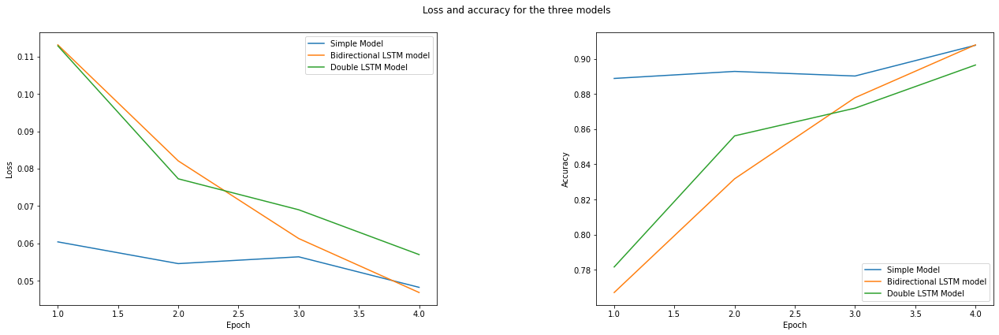

In [56]:
plot_loss_acc([losses_first_model,losses_bi, losses_double],
              [accs_first_model,accs_bi, accs_double],
              ["Simple Model", "Bidirectional LSTM model", "Double LSTM Model"],
              "Loss and accuracy for the three models")

In [60]:
acc_valid_double, loss_valid_double = evaluate_validation(model_double, path_valid, valid_list)

In [61]:
print("Validation results for the bidirectional model")
print("\t Accuracy: " + str(acc_valid_double))
print("\t Loss    : " + str(loss_valid_double))

Validation results for the bidirectional model
	 Accuracy: 0.9098148148148149
	 Loss    : 0.25302332639694214


- ¿Qué modelo obtiene un mejor resultado sobre los datos de validación, _Model_1_ o _Model_2_? ¿Por qué puede ocurrir esto?

Respondemos junto con la siguiente pregunta.

- Y con respecto a _Model_1B_, ¿cuál es mejor?

Vamos a responder a esta pregunta junto con la anterior, haciendo uso de las gráficas de accuracy y función de pérdida mostradas previamente. Además, recopilamos todos los resultados en una tabla:

| Modelo               	| Train    	| Validation 	|
|----------------------	|----------	|------------	|
| Modelo Original      	| $0.9076$ 	| $0.9081$   	|
| Modelo Bidirectional 	| $0.9079$ 	| $0.9093$   	|
| Modelo Doble LSTM    	| $0.8964$ 	| $0.90981$  	|

En general, podemos ver que ni el modelo Bidireccional ni el modelo con doble LSTM han conseguido mejorar en $5$ épocas al modelo original. Este modelo original es más sencillo y tarda por tanto menos iteraciones en converger a la mejor solución que este puede obtener, según el número de parámetros que puede entrenar. 

Se puede apreciar también, mirando las últimas gráficas, que el modelo con **doble LSTM** es el que más lento aumenta su accuracy y disminuye su valor de la función de pérdida. Como comentábamos, esto tiene sentido desde el punto de vista del número de parámetros que tiene que entrenar. 

Con toda esta información, podríamos decir que **para esta configuración de entrenamiento concreta**, el **primer modelo** (Model 1) sería el mejor de todos, debido a que es más simple que los demás y tratamos de premiar el principio de la navaja de Occam. **Sin embargo**, esta decisión podría cambiar de forma drástica si utilizásemos hiperparámetros de entrenamiento diferentes, como el número de épocas (que posiblemente sería el más relevante en cuanto a marcar una diferencia en los resultados), como las dimensiones de entrada a las LSTM o la longitud de los segmentos utilizada.